from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"




### -----------------------------------------------------------------------------------
# ※ Problem Statement
### -----------------------------------------------------------------------------------

### ⫸ Build a model wherein you need to assign
    ✓ a lead score to each of the leads
    ✓ The customers with higher lead score have a higher conversion chance 
    ✓ The customers with lower lead score have a lower conversion chance.


### import all necessary libraries

In [1]:


import pandas as pd
import numpy as np
# import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import os
from  plotly.offline import plot
# import chart_studio.plotly as py
import cufflinks as cf
cf.go_offline()
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
init_notebook_mode(connected='true')
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set() # Setting seaborn as default style even if use only matplotlib
import pandas as pd
import datetime as dt
import scipy.stats 
from scipy.stats import spearmanr as spearman
from scipy.stats import kendalltau as kendall
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import kstest
import random

# for integer encoding using sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import VarianceThreshold
import pandas as pd
import numpy as np

from sklearn.linear_model import LogisticRegression

# import classes for imputation
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# import extra classes for modelling
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

np.random.seed(0)


from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
# import pandas_profiling as pp
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [2]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
sns.set() # Setting seaborn as default style even if use only matplotlib


### -----------------------------------------------------------------------------------
## ※ Read DataFrame 
### -----------------------------------------------------------------------------------


In [3]:
file ='Leads.csv'
data= pd.read_csv(file)
print(data.shape)
data.head()


(9240, 37)


,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [4]:
data['Converted'].value_counts()

0    5679
1    3561
Name: Converted, dtype: int64


### -----------------------------------------------------------------------------------
# ※  Check for duplicate entries  and drop
### -----------------------------------------------------------------------------------



In [5]:

duplicate = data[data.duplicated()]
duplicate

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity


# Based on above  output we can say no duplicates were present in dataset


### -----------------------------------------------------------------------------------
# ※  AnaLysing Categorical columns
### -----------------------------------------------------------------------------------



In [7]:
cols = data.columns
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target SalePrice
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']
target_col = 'Converted'

In [8]:
len(cat_cols)

30

In [9]:
for  c in  cat_cols:
    print(c)
    print(data[c].value_counts())

Prospect ID
7927b2df-8bba-4d29-b9a2-b6e0beafe620    1
22e9d4ef-d294-4ebf-81c7-7c7a1105aeea    1
46befc49-253a-419b-abea-2fd978d2e2b1    1
9d35a2c2-09d8-439f-9875-0e8bbf267f5a    1
f0de9371-4dc2-48c2-9785-a08d6fc4fcb5    1
                                       ..
ff1f7582-cb7b-4b94-9cdc-3d0d0afdd9a3    1
644099a2-3da4-4d23-9546-7676340a372b    1
2a093175-415b-4321-9e69-ed8d9df65a3c    1
c66249a3-8500-4c66-a511-312d914573de    1
571b5c8e-a5b2-4d57-8574-f2ffb06fdeff    1
Name: Prospect ID, Length: 9240, dtype: int64
Lead Origin
Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: Lead Origin, dtype: int64
Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Clic

In [10]:
for  c in  cat_cols:
    print(c)
    print(data[c].nunique())

Prospect ID
9240
Lead Origin
5
Lead Source
21
Do Not Email
2
Do Not Call
2
Last Activity
17
Country
38
Specialization
19
How did you hear about X Education
10
What is your current occupation
6
What matters most to you in choosing a course
3
Search
2
Magazine
1
Newspaper Article
2
X Education Forums
2
Newspaper
2
Digital Advertisement
2
Through Recommendations
2
Receive More Updates About Our Courses
1
Tags
26
Lead Quality
5
Update me on Supply Chain Content
1
Get updates on DM Content
1
Lead Profile
6
City
7
Asymmetrique Activity Index
3
Asymmetrique Profile Index
3
I agree to pay the amount through cheque
1
A free copy of Mastering The Interview
2
Last Notable Activity
16


In [11]:
print(data['Prospect ID'].nunique())
print(data['Lead Number'].nunique())

9240
9240



## ✓  'Prospect ID' and 'Lead Number' 




## has high Cardinality i.e. unique values = len of dataset hence we can dop as one and set lead number as index

In [12]:
data.drop(labels =['Prospect ID'],inplace = True, axis =1)
data.set_index('Lead Number',inplace = True)

In [13]:
cols = data.columns
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target SalePrice
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']
target_col = 'Converted'

In [14]:
# Looking at Cardinality of Categorical variables
print('Number of categories in ')
for c in cat_cols:
    print(' {} : {}'.format(c,
                    len(data[c].unique())))

Number of categories in 
 Lead Origin : 5
 Lead Source : 22
 Do Not Email : 2
 Do Not Call : 2
 Last Activity : 18
 Country : 39
 Specialization : 20
 How did you hear about X Education : 11
 What is your current occupation : 7
 What matters most to you in choosing a course : 4
 Search : 2
 Magazine : 1
 Newspaper Article : 2
 X Education Forums : 2
 Newspaper : 2
 Digital Advertisement : 2
 Through Recommendations : 2
 Receive More Updates About Our Courses : 1
 Tags : 27
 Lead Quality : 6
 Update me on Supply Chain Content : 1
 Get updates on DM Content : 1
 Lead Profile : 7
 City : 8
 Asymmetrique Activity Index : 4
 Asymmetrique Profile Index : 4
 I agree to pay the amount through cheque : 1
 A free copy of Mastering The Interview : 2
 Last Notable Activity : 16



### -----------------------------------------------------------------------------------
# ※  Checking for missing data
### -----------------------------------------------------------------------------------



In [15]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(data.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(data.isnull().sum()/data.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1)

,Total,Percentage
Lead Quality,4767,51.59
Asymmetrique Activity Index,4218,45.65
Asymmetrique Profile Score,4218,45.65
Asymmetrique Profile Index,4218,45.65
Asymmetrique Activity Score,4218,45.65
Tags,3353,36.29
Lead Profile,2709,29.32
What matters most to you in choosing a course,2709,29.32
What is your current occupation,2690,29.11
Country,2461,26.63


### -----------------------------------------------------------------------------------
# ✓ Handling Outliers in Numerical cols
### -----------------------------------------------------------------------------------


In [16]:
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target Converted
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']

In [17]:
# Outlier Analysis
fig = go.Figure()
fig = make_subplots(rows=1, cols=len(num_cols))
c=0
for col in num_cols : 
    c = c+1
    fig.add_trace(go.Box(y=data[col],name = col),row = 1, col =c )
fig.show()

In [18]:
def find_skewed_boundaries(df, variable, distance):

    # Let's calculate the boundaries outside which sit the outliers
    # for skewed distributions

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [19]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=len(num_cols))
c=0
for col in num_cols : 
    upper_limit, lower_limit = find_skewed_boundaries(data, col, 1.5)
    print(col ,' - upper_limit : ', upper_limit, 'lower_limit : ', lower_limit)
    # Now let's replace the outliers by the maximum and minimum limit

    data[col]= np.where(data[col] > upper_limit, upper_limit,
                            data[col])
    
    
    data[col]= np.where(data[col] < lower_limit, lower_limit,
                            data[col])
    c = c+1
    fig.add_trace(go.Box(y=data[col],name = col),row = 1, col =c )
fig.show()

TotalVisits  - upper_limit :  11.0 lower_limit :  -5.0
Total Time Spent on Website  - upper_limit :  2322.0 lower_limit :  -1374.0
Page Views Per Visit  - upper_limit :  6.0 lower_limit :  -2.0
Asymmetrique Activity Score  - upper_limit :  16.5 lower_limit :  12.5
Asymmetrique Profile Score  - upper_limit :  22.5 lower_limit :  10.5


### -----------------------------------------------------------------------------------
# ✓ Looking at the distribution after  outlier removal
### -----------------------------------------------------------------------------------


In [20]:
c =  1
r = 1
fig = go.Figure()
fig = make_subplots(rows=3, cols=2)
# colors = ['#A56CC1', '#A6ACEC', '#63F5EF','#9999EF','#67676CD']
hist_data = [] 
group_labels=[]
for numcol in num_cols:   
    group_labels.append(numcol)
    hist_data.append(data[numcol])
    #sns.kdeplot(data[numcol])
    #plt.show()
    temp = data.sort_values(numcol)
    fig.add_trace(go.Histogram(x = temp[numcol]#, marginal="violin"
                         ,name = numcol ), row = r, col =c)
                  
    c = c+1 
    if c > 2 : 
        c =1
        r = r+1       
                  
fig.update_layout(title_text='Hist Plot')
fig.show()

### -----------------------------------------------------------------------------------
# ✓ Pairplots of all numerical var
### -----------------------------------------------------------------------------------


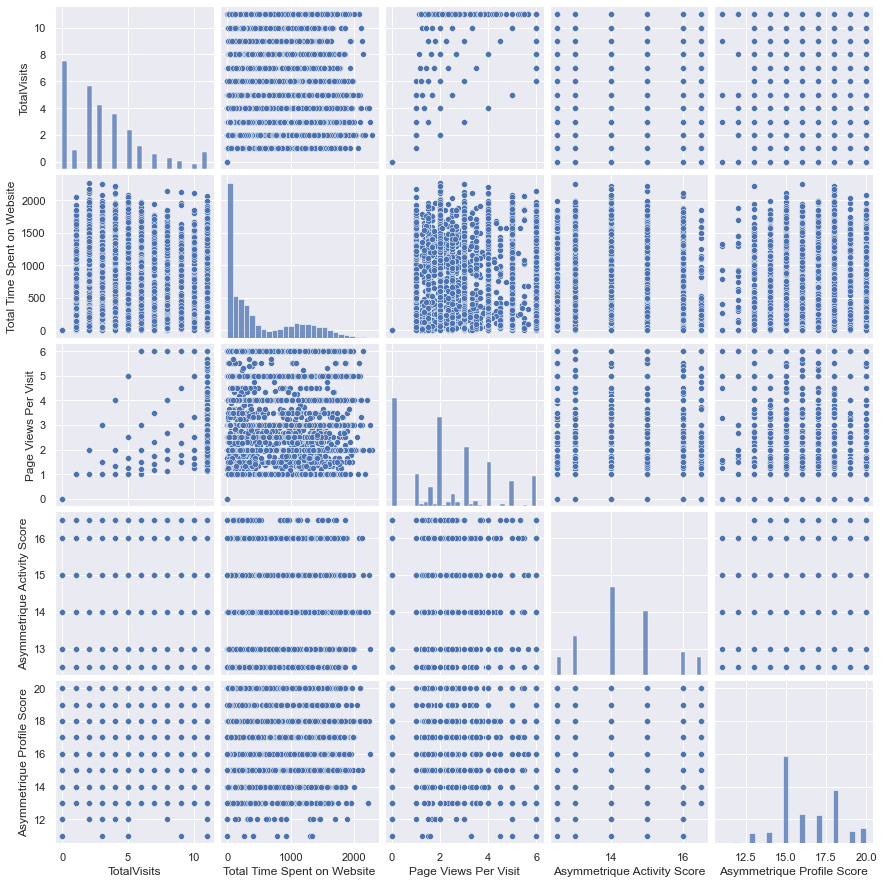

In [21]:
sns.pairplot(data= data[num_cols])

### -----------------------------------------------------------------------------------
# ✓ Checking the skewness of numerical columns
### -----------------------------------------------------------------------------------


In [22]:
for col in num_cols:
    print(col ,"\t:\t" ,data[col].skew())
    print(kstest(data[col], "norm")  )

TotalVisits 	:	 0.9592734394578649
KstestResult(statistic=nan, pvalue=nan)
Total Time Spent on Website 	:	 0.9564501929530472
KstestResult(statistic=0.7593839131737513, pvalue=0.0)
Page Views Per Visit 	:	 0.43188720425523214
KstestResult(statistic=nan, pvalue=nan)
Asymmetrique Activity Score 	:	 0.2198788427192672
KstestResult(statistic=nan, pvalue=nan)
Asymmetrique Profile Score 	:	 0.2217387180981609
KstestResult(statistic=nan, pvalue=nan)




### ⫸ In Logistic Regression we make assumption of linearity 
### ⫸ Features are Normally distributed 
### ⫸ We need Features  with -0.5 < skewness < 0.5   for normality Assumption to hold true
### ⫸ Lets Check if these assumptions are  followed by our dataset

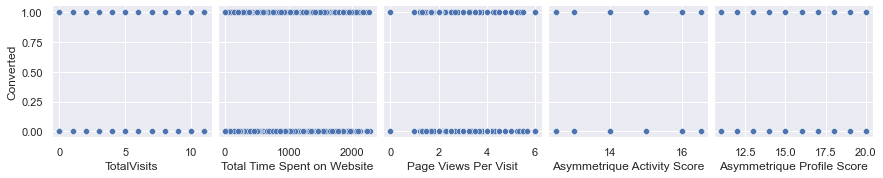

In [23]:
sns.pairplot(data= data, x_vars = num_cols, y_vars = target_col)

### -----------------------------------------------------------------------------------
# ※ Analysing Categorical variables
### -----------------------------------------------------------------------------------


### ✓ for Analysis Purpose 

In [24]:
for c in cat_cols : 
    data[c].value_counts()

### -----------------------------------------------------------------------------------
# ✓ Dealing With Rare Category 

### -----------------------------------------------------------------------------------


### -----------------------------------------------------------------------------------
## High cardinality may pose the following problems:

#### Variables with too many labels tend to dominate over those with only a few labels, particularly in Tree based algorithms.

#### A big number of labels within a variable may introduce noise with little, if any, information, therefore making machine learning models prone to over-fit.

#### Some of the labels may only be present in the training data set, but not in the test set, therefore machine learning algorithms may over-fit to the training set.

#### Contrarily, some labels may appear only in the test set, therefore leaving the machine learning algorithms unable to perform a calculation over the new (unseen) observation.

### -----------------------------------------------------------------------------------

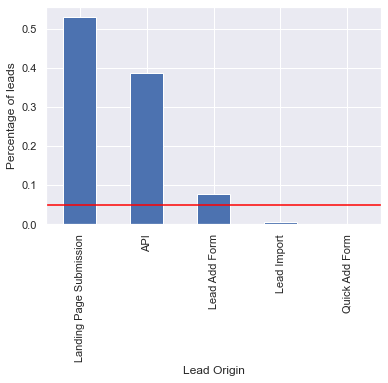

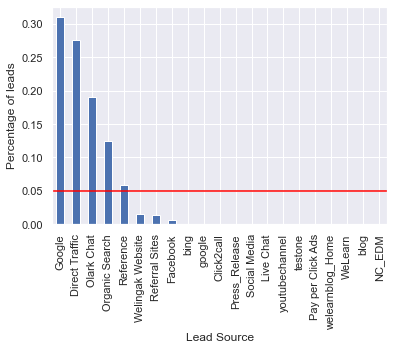

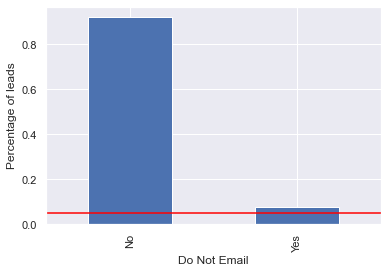

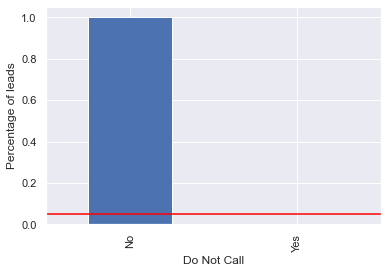

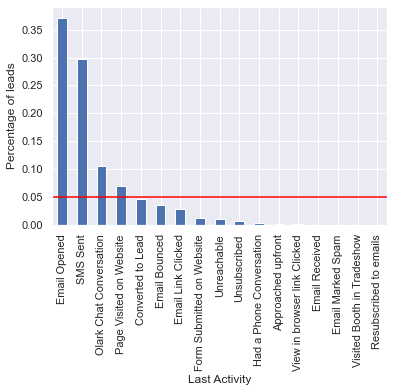

...

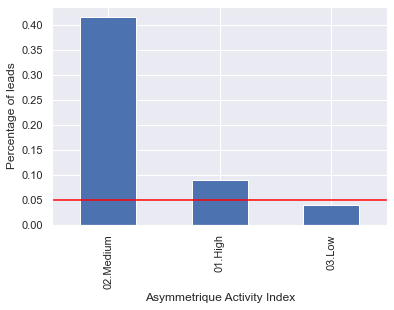

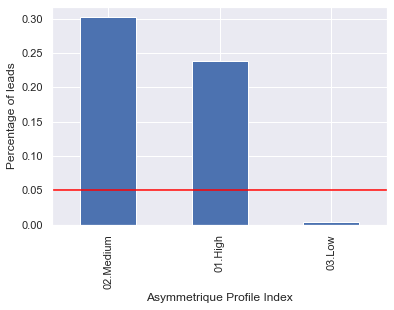

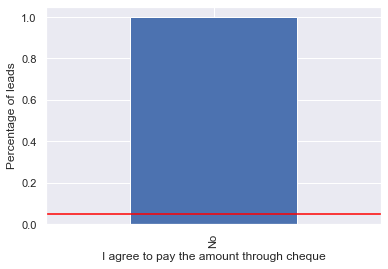

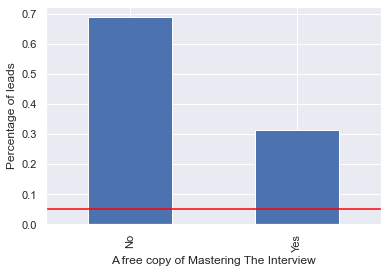

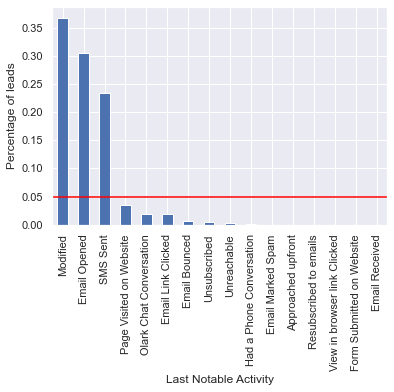

In [25]:
# let's plot how frequently each label
# appears in the dataset

# in other words, the percentage of Leads in the data
# with each label

leads = len(data)

# for each categorical variable
for col in cat_cols:

    # count the number of leads per category
    # and divide by leads houses

    # aka percentage of Leads per category

    temp_df = pd.Series(data[col].value_counts() / leads)

    # make plot with the above percentages
    fig = temp_df.sort_values(ascending=False).plot.bar()
    fig.set_xlabel(col)

    # add a line at 5 % to flag the threshold for rare categories
    fig.axhline(y=0.05, color='red')
    fig.set_ylabel('Percentage of leads')
    plt.show()

# Rare labels: grouping under a new label
## rare or infrequent values,  group them under an umbrella category called 'Rare' or 'Other'

In [26]:
# I will replace all the labels that appear in less than 5%
# of the leads by the label 'rare'


def group_rare_labels(df, var):

    leads = len(df)

    # first I calculate the % of leads for each category
    temp_df = pd.Series(df[var].value_counts() / leads)

    # now I create a dictionary to replace the rare labels with the
    # string 'rare' if they are present in less than 5% of leads

    grouping_dict = {
        k: ('rare' if k not in temp_df[temp_df >= 0.05].index else k)
        for k in temp_df.index
    }

    # now I replace the rare categories
    tmp = df[var].map(grouping_dict)

    return tmp

In [27]:
# group rare labels in Categorical Variables
for catcol in cat_cols : 
    # we ll consider only categorical variav=ble with cardinality higher than 2
    if len(data[catcol].value_counts())>2 : 
        print('-'*99)
        print(data[catcol].value_counts())
        data[catcol] = group_rare_labels(data, catcol)


        print( data[catcol].value_counts())

---------------------------------------------------------------------------------------------------
Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: Lead Origin, dtype: int64
Landing Page Submission    4886
API                        3580
Lead Add Form               718
rare                         56
Name: Lead Origin, dtype: int64
---------------------------------------------------------------------------------------------------
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welear



### -----------------------------------------------------------------------------------
# ※ Handling 'SELECT' Categories 
### -----------------------------------------------------------------------------------

## ✓ Replacing them as NULL

In [28]:
cols = data.columns
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target SalePrice
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']
target_col = 'Converted'

In [29]:
data =data.replace('Select',np.NaN)
for c in cat_cols:
    print(c ,data[c].isna().mean()*100)

Lead Origin 0.0
Lead Source 0.38961038961038963
Do Not Email 0.0
Do Not Call 0.0
Last Activity 1.1147186147186148
Country 26.634199134199132
Specialization 36.58008658008658
How did you hear about X Education 78.46320346320347
What is your current occupation 29.11255411255411
What matters most to you in choosing a course 29.318181818181817
Search 0.0
Magazine 0.0
Newspaper Article 0.0
X Education Forums 0.0
Newspaper 0.0
Digital Advertisement 0.0
Through Recommendations 0.0
Receive More Updates About Our Courses 0.0
Tags 36.28787878787879
Lead Quality 51.590909090909086
Update me on Supply Chain Content 0.0
Get updates on DM Content 0.0
Lead Profile 74.18831168831169
City 39.70779220779221
Asymmetrique Activity Index 45.64935064935065
Asymmetrique Profile Index 45.64935064935065
I agree to pay the amount through cheque 0.0
A free copy of Mastering The Interview 0.0
Last Notable Activity 0.0


In [30]:
# Analysing  Specialization 

In [31]:

# data =data.replace('Select',np.NaN)
col ='Specialization'
fig = go.Figure()
temp = data[data[target_col]==1].replace(np.NaN, 'Missing')
print(col)

fig.add_trace(go.Histogram(x=temp[col], name = "Converted=1",))
temp = data[data[target_col]==0].replace(np.NaN, 'Missing')
fig.add_trace(go.Histogram(x=temp[col], name = "Converted=0",))

fig.show()


Specialization


## We can say that specialization definitely plays importat role in deciding  Lead
## hence we cant remove or impute these values 
## lets Keep this 'Select' as missing 

In [32]:
data['Specialization'] = data['Specialization'].replace(np.NaN, 'Missing')


### -----------------------------------------------------------------------------------
# ※ EDA on Categorical columns wrt Target_col
### -----------------------------------------------------------------------------------



In [33]:


for col in cat_cols[:5] : 
    fig = go.Figure()
    temp = data[data[target_col]==1]
    print(col)
   
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=1",))
    temp = data[data[target_col]==0]
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=0",))
    
    fig.show()

Lead Origin


Lead Source


Do Not Email


Do Not Call


Last Activity


In [34]:


for col in cat_cols[5:10] : 
    fig = go.Figure()
    temp = data[data[target_col]==1]
    print(col)
   
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=1",))
    temp = data[data[target_col]==0]
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=0",))
    
    fig.show()

Country


Specialization


How did you hear about X Education


What is your current occupation


What matters most to you in choosing a course


In [35]:


for col in cat_cols[10:15] : 
    fig = go.Figure()
    temp = data[data[target_col]==1]
    print(col)
   
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=1",))
    temp = data[data[target_col]==0]
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=0",))
    
    fig.show()

Search


Magazine


Newspaper Article


X Education Forums


Newspaper


In [36]:


for col in cat_cols[15:] : 
    fig = go.Figure()
    temp = data[data[target_col]==1]
    print(col)
   
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=1",))
    temp = data[data[target_col]==0]
    fig.add_trace(go.Histogram(x=temp[col], name = "Converted=0",))
    
    fig.show()

Digital Advertisement


Through Recommendations


Receive More Updates About Our Courses


Tags


Lead Quality


Update me on Supply Chain Content


Get updates on DM Content


Lead Profile


City


Asymmetrique Activity Index


Asymmetrique Profile Index


I agree to pay the amount through cheque


A free copy of Mastering The Interview


Last Notable Activity


# ※ Observations  From above plots
    ⫷⫸ Higher no of customers converted who were unemployed and Working
    ⫷⫸ Less customers converted when Last notable activity is Email opened  and  modified 
    ⫷⫸  Less customers converted when Asymmetrique Profile Index = Medium
    ⫷⫸ Highest People Converted when Tags  =  Will Revert After Reading
    ⫷⫸ Highest People Converted when Lead Quality  =  Mightbe 
    ⫷⫸ More People Converted when Lead Profile =  Potential Lead
    ⫷⫸ More number Converted were from MUMbai CIty
    ⫷⫸ More number Converted were from GOOGLE and Direct Traffic
        
        
    

### -----------------------------------------------------------------------------------
# ✓ Encoding Categorical Variables using 'Dummies': 
### -----------------------------------------------------------------------------------
   

In [37]:
cat = data.select_dtypes(include = ['object'])
print(cat)
cat_dummies = pd.get_dummies(cat, drop_first = True)

data.drop(columns = list(cat.columns), inplace = True)
data = pd.concat([data, cat_dummies], axis = 1)
data.head()

                         Lead Origin     Lead Source Do Not Email Do Not Call  \
Lead Number                                                                     
660737                           API      Olark Chat           No          No   
660728                           API  Organic Search           No          No   
660727       Landing Page Submission  Direct Traffic           No          No   
660719       Landing Page Submission  Direct Traffic           No          No   
660681       Landing Page Submission          Google           No          No   
...                              ...             ...          ...         ...   
579564       Landing Page Submission  Direct Traffic          Yes          No   
579546       Landing Page Submission  Direct Traffic           No          No   
579545       Landing Page Submission  Direct Traffic          Yes          No   
579538       Landing Page Submission          Google           No          No   
579533       Landing Page Su

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,...,City_Thane & Outskirts,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare
Lead Number,,,,,,,,,,,,,,,,,,,,,
660737,0,0.0,0.0,0.0,15.0,15.0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
660728,0,5.0,674.0,2.5,15.0,15.0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
660727,1,2.0,1532.0,2.0,14.0,20.0,1,0,0,0,...,0,0,1,0,0,0,1,0,0,0
660719,0,1.0,305.0,1.0,13.0,17.0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
660681,1,2.0,1428.0,1.0,15.0,18.0,1,0,0,1,...,0,0,1,0,0,0,0,1,0,0


### -----------------------------------------------------------------------------------
# ※ Correlation plot 
### -----------------------------------------------------------------------------------


<AxesSubplot:>

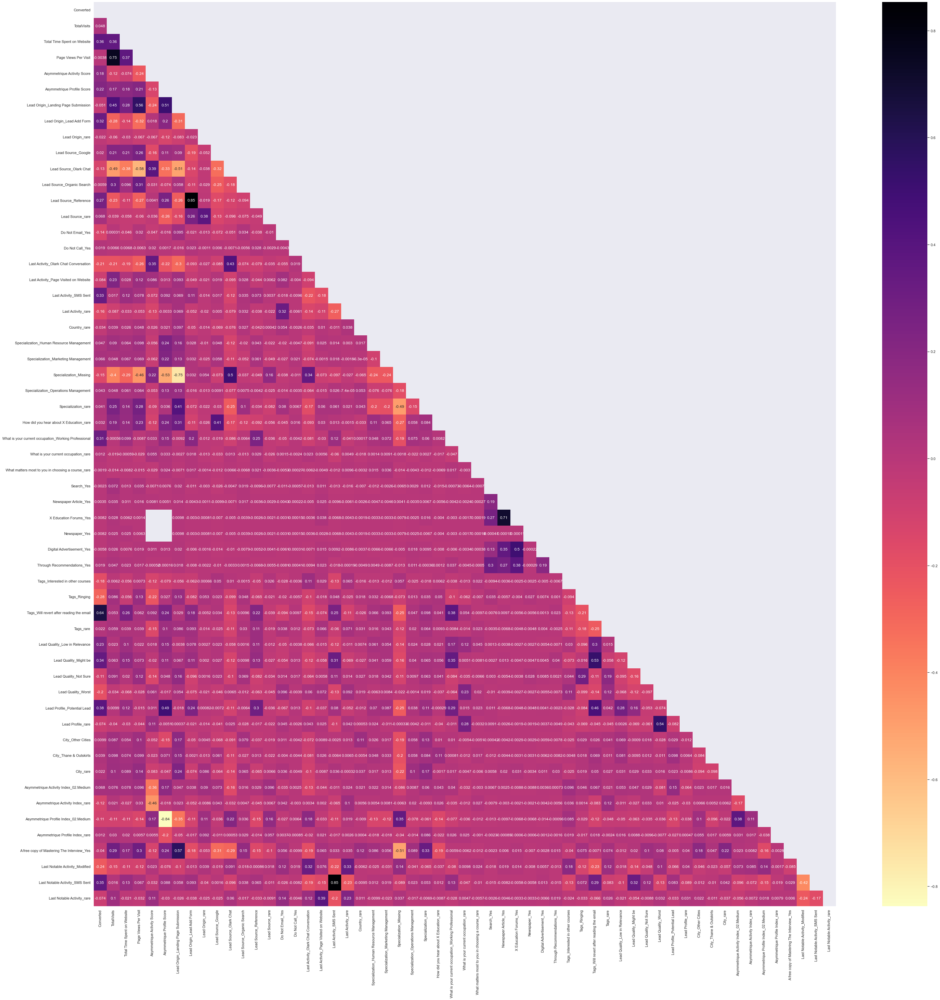

In [38]:

mask = np.triu(np.ones_like(data.corr()))

fig, ax = plt.subplots(figsize=(50,50))   
sns.heatmap(data.corr(),cmap='magma_r' ,annot=True, mask=mask,ax=ax)

In [39]:
data.shape

(9240, 57)

In [40]:
correaltions = data.drop('Converted', axis=1 ).corr().abs().unstack().sort_values(ascending = False)


# correaltions = correaltions.unstack()
# correaltions= correaltions.sort_values(kind="quicksort")

print(len(correaltions))
correaltions = correaltions.to_frame().reset_index()#.query('level_0' != 'level_1')
correaltions = correaltions[correaltions['level_0'] != correaltions['level_1']]

correaltions = correaltions[correaltions[0] >0.9]
print(correaltions)
highlyCorrelatedFeatures = list(set(correaltions['level_0'].unique()) and set(correaltions['level_1'].unique()))


3136
Empty DataFrame
Columns: [level_0, level_1, 0]
Index: []


# ✓ From above exercise we can say there are no features which are highly correlated : 


In [41]:
data.drop(labels =highlyCorrelatedFeatures, inplace= True, axis =1)

## 

### -----------------------------------------------------------------------------------
# ※ Dropping Columns havin more than 45% data Missing
### -----------------------------------------------------------------------------------



In [42]:
# dropping cols with >20%
rem = []

cols =data.drop(labels = 'Converted', axis =1).columns

for c in cols:
    if round(100*(data[c].isnull().sum()/data.shape[0]),2) > 45 : 
        rem.append(c)
        
print('Columns to be dropped  : \n',rem)
print('before : ',data.shape)
data.drop(labels = rem, inplace = True, axis =1)
print('After Drop : ',data.shape)

Columns to be dropped  : 
 ['Asymmetrique Activity Score', 'Asymmetrique Profile Score']
before :  (9240, 57)
After Drop :  (9240, 55)



### -----------------------------------------------------------------------------------
# ※ Dropping Rows with all row  Missing
### -----------------------------------------------------------------------------------


In [43]:
data = data.dropna(how ='all',axis =0)
data.shape

(9240, 55)


### -----------------------------------------------------------------------------------
# ※ Dropping Rows with more than 70 % Data Missing
### -----------------------------------------------------------------------------------


In [44]:
int(data.shape[1]*0.7)

38

In [45]:
print(data.shape)
x = data.dropna(thresh=int(data.shape[1]*0.7),axis =0)
print(x.shape)
x = data[data.isnull().sum(axis=1) >int(data.shape[1]*0.7)]
print(x.shape)


(9240, 55)
(9240, 55)
(0, 55)


In [46]:
perc = 70.0 # Here N is 70
min_count =  int(((100-perc)/100)*data.shape[1] + 1)
x = data.dropna( axis=0, 
                    thresh=min_count)
x.shape

(9240, 55)

# ✓ From above exercise we observe that almost all rows contain atleast 70 %  values null
# ✓ hence dropping rows is not good idea to drop rows 

In [47]:
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target Converted
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']



In [48]:
data.head(2)

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,...,City_Thane & Outskirts,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare
Lead Number,,,,,,,,,,,,,,,,,,,,,
660737,0,0.0,0.0,0.0,0,0,0,0,1,0,...,0,0,1,0,1,0,0,1,0,0
660728,0,5.0,674.0,2.5,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,0




### -----------------------------------------------------------------------------------
# ※ Finding Best Imputation Techniques 
### -----------------------------------------------------------------------------------

In [49]:
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target Converted
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']

In [50]:

# inspect the categorical variables

data[cat_cols].head()

""
Lead Number
660737
660728
660727
660719
660681


In [51]:
# separate intro train and test set

X_train, X_test, y_train, y_test = train_test_split(
    data.drop('Converted', axis=1),  # just the features
    data['Converted'],  # the target
    test_size=0.3,  # the percentage of obs in the test set
    random_state=0)  # for reproducibility

X_train.shape, X_test.shape

((6468, 54), (2772, 54))

In [52]:
X_train


,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,...,City_Thane & Outskirts,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare
Lead Number,,,,,,,,,,,,,,,,,,,,,
598950,2.0,1106.0,2.0,1,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,1,0
612511,5.0,201.0,5.0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,1,1,0,0
610784,4.0,244.0,4.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
641136,2.0,1410.0,1.0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
612796,0.0,0.0,0.0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589309,4.0,1055.0,4.0,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,1,0,0
579744,2.0,74.0,2.0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,1,1,0,0
613440,0.0,0.0,0.0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:

y_train


Lead Number
598950    1
612511    0
610784    0
641136    0
612796    0
         ..
589309    1
579744    0
613440    0
628694    0
633443    0
Name: Converted, Length: 6468, dtype: int64

In [54]:
X_test


,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,...,City_Thane & Outskirts,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare
Lead Number,,,,,,,,,,,,,,,,,,,,,
638355,2.0,1099.0,2.00,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,1,0,0
630775,1.0,1247.0,1.00,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
616592,1.0,198.0,1.00,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
611224,5.0,245.0,2.50,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0
591141,0.0,0.0,0.00,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588753,0.0,0.0,0.00,0,1,0,0,0,0,1,...,0,0,1,0,0,0,0,1,0,0
580800,0.0,0.0,0.00,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
602193,2.0,596.0,2.00,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [55]:


y_test

Lead Number
638355    0
630775    1
616592    0
611224    0
591141    0
         ..
588753    1
580800    0
602193    0
599247    0
651812    1
Name: Converted, Length: 2772, dtype: int64

## ✓ We create the preprocessing pipelines for both numerical and categorical data

In [56]:
# We create the preprocessing pipelines for both
# numerical and categorical data

# adapted from Scikit-learn code available here under BSD3 license:
# https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy=['median','mean','mode'])),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', numeric_transformer, num_cols),
        ('categorical', categorical_transformer, cat_cols)])



# Note that to initialise the pipeline I pass any argument to the transformers.
# Those will be changed during the gridsearch below.

In [57]:
# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.

clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier',RandomForestClassifier(n_estimators=100))])


# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.

clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier())])

In [58]:
# now we create the grid with all the parameters that we would like to test

param_grid = {
    'preprocessor__numerical__imputer__strategy': ['mean', 'median','mode'],
    'preprocessor__categorical__imputer__strategy': ['most_frequent', 'constant'],
    
}

grid_search = GridSearchCV(clf, param_grid, cv=5, n_jobs=-1, scoring='f1')



# and now we train over all the possible combinations of the parameters above

In [59]:
# and now we train over all the possible combinations of the parameters above
grid_search.fit(X_train, y_train)

# and we print the best score over the train set
print(("best linear regression from grid search: %.3f"
       % grid_search.score(X_train, y_train)))

best linear regression from grid search: 0.986


In [60]:
# we can print the best estimator parameters like this
grid_search.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['TotalVisits',
                                                   'Total Time Spent on '
                                                   'Website',
                                                   'Page Views Per Visit',
                                                   'Lead Origin_Landing Page '
                                                   'Submission',
                                                   'Lead Origin_Lead Add Form',
                                                   'Lead Origin_rare',
                                                   'Lead Source_Google',
                                                   'Lead Source_Olark Ch...
                                                   'Professional',
                                                   'What is your current '
                                                   'occupation_rare',
                                                   'What matters most to you '
                                                   'in choosing a course_rare',
                                                   'Search_Yes',
                                                   'Newspaper Article_Yes',
                                                   'X Education Forums_Yes', ...]),
                                                 ('categorical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [])])),
                ('classifier', RandomForestClassifier())])

In [61]:
# and find the best fit parameters like this
grid_search.best_params_

{'preprocessor__categorical__imputer__strategy': 'constant',
 'preprocessor__numerical__imputer__strategy': 'median'}

In [62]:
grid_search.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['TotalVisits',
                                                   'Total Time Spent on '
                                                   'Website',
                                                   'Page Views Per Visit',
                                                   'Lead Origin_Landing Page '
                                                   'Submission',
                                                   'Lead Origin_Lead Add Form',
                                                   'Lead Origin_rare',
                                                   'Lead Source_Google',
                                                   'Lead Source_Olark Ch...
                                                   'Professional',
                                                   'What is your current '
                                                   'occupation_rare',
                                                   'What matters most to you '
                                                   'in choosing a course_rare',
                                                   'Search_Yes',
                                                   'Newspaper Article_Yes',
                                                   'X Education Forums_Yes', ...]),
                                                 ('categorical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [])])),
                ('classifier', RandomForestClassifier())])

In [63]:
print(" MEAN TEST SCORE ==>", grid_search.cv_results_["mean_test_score"])

 MEAN TEST SCORE ==> [0.87690202 0.87626605        nan 0.87489722 0.87886858        nan]


# The best fit parameters : {'preprocessor__categorical__imputer__strategy': 'constant',
# 'preprocessor__numerical__imputer__strategy': 'mean'}

### -----------------------------------------------------------------------------------
# ※ Imputing Missing Data Using  
### -----------------------------------------------------------------------------------
#### ✓ from above exercise we can say :
#### ✓ Frequent value inputation in Categorical Variables 
#### ✓ Median Imputation in Numerical Variables

In [64]:
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in data.columns if data[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target Converted
num_cols = [c for c in data.columns if data[c].dtypes!='O' and c !='Converted']

In [65]:
# let's make a function to add a missing indicator
# binary variable

def missing_indicator(df, variable):    
    return np.where(df[variable].isnull(), 1, 0)

In [66]:
cols_to_use = [c for c in data.columns if data[c].isna().sum()>0]

In [67]:
# let's loop over all the variables and add a binary 
# missing indicator with the function we created

for variable in cols_to_use:
    X_train[variable+'_NA'] = missing_indicator(X_train, variable)
    X_test[variable+'_NA'] = missing_indicator(X_test, variable)
    
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,...,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare,TotalVisits_NA,Page Views Per Visit_NA
Lead Number,,,,,,,,,,,,,,,,,,,,,
598950,2.0,1106.0,2.0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
612511,5.0,201.0,5.0,1,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0
610784,4.0,244.0,4.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
641136,2.0,1410.0,1.0,0,0,0,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
612796,0.0,0.0,0.0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [68]:
# let's loop over all the variables and add a binary 
# missing indicator with the function we created

for variable in cols_to_use:
    X_train[variable+'_NA'] = missing_indicator(X_train, variable)
    X_test[variable+'_NA'] = missing_indicator(X_test, variable)
    
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,...,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare,TotalVisits_NA,Page Views Per Visit_NA
Lead Number,,,,,,,,,,,,,,,,,,,,,
598950,2.0,1106.0,2.0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
612511,5.0,201.0,5.0,1,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0
610784,4.0,244.0,4.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
641136,2.0,1410.0,1.0,0,0,0,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
612796,0.0,0.0,0.0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [69]:
# now let's evaluate the mean value of the missing indicators

# first I capture the missing indicator variables with a 
# list comprehension
missing_ind = [col for col in X_train.columns if 'NA' in col]

# calculate the mean
X_train[missing_ind].mean()

TotalVisits_NA             0.014997
Page Views Per Visit_NA    0.014997
dtype: float64

In [70]:
# the mean of the missing indicator
# coincides with the percentage of missing values
# in the original variable

X_train.isnull().mean()

TotalVisits                                             0.014997
Total Time Spent on Website                             0.000000
Page Views Per Visit                                    0.014997
Lead Origin_Landing Page Submission                     0.000000
Lead Origin_Lead Add Form                               0.000000
Lead Origin_rare                                        0.000000
Lead Source_Google                                      0.000000
Lead Source_Olark Chat                                  0.000000
Lead Source_Organic Search                              0.000000
Lead Source_Reference                                   0.000000
Lead Source_rare                                        0.000000
Do Not Email_Yes                                        0.000000
Do Not Call_Yes                                         0.000000
Last Activity_Olark Chat Conversation                   0.000000
Last Activity_Page Visited on Website                   0.000000
Last Activity_SMS Sent   

In [71]:
# let's make a function to fill missing values with a value:


def impute_na(df, variable, value):
    return df[variable].fillna(value)

In [72]:
# let's impute the NA with  the median for numerical
# variables
# remember that we calculate the median using the train set

In [73]:

for cols in num_cols :
    median = X_train[cols].median()
    X_train[cols] = impute_na(X_train, cols, median)
    X_test[cols] = impute_na(X_test, cols, median)
for cols in cat_cols : 
    mode = X_train[cols].mode()
    constant = 'Missing'
    
    X_train[cols] = impute_na(X_train, cols, constant)
    X_test[cols] = impute_na(X_test, cols, constant)

In [74]:
# and now let's check there are no more NA
X_train.isnull().mean()

TotalVisits                                             0.0
Total Time Spent on Website                             0.0
Page Views Per Visit                                    0.0
Lead Origin_Landing Page Submission                     0.0
Lead Origin_Lead Add Form                               0.0
Lead Origin_rare                                        0.0
Lead Source_Google                                      0.0
Lead Source_Olark Chat                                  0.0
Lead Source_Organic Search                              0.0
Lead Source_Reference                                   0.0
Lead Source_rare                                        0.0
Do Not Email_Yes                                        0.0
Do Not Call_Yes                                         0.0
Last Activity_Olark Chat Conversation                   0.0
Last Activity_Page Visited on Website                   0.0
Last Activity_SMS Sent                                  0.0
Last Activity_rare                      

In [75]:
X_train.shape

(6468, 56)

In [76]:
y_train.shape

(6468,)


### -----------------------------------------------------------------------------------
# Removing constant features
### -----------------------------------------------------------------------------------


## ✓ The VarianceThreshold from sklearn provides a simple baseline approach to feature selection. It removes all features which variance doesn’t meet a certain threshold. 
## ✓ By default, it removes all zero-variance features, i.e., features that have the same value in all samples

In [77]:
x_train_ind  = X_train.index
x_test_ind = X_test.index

In [78]:
sel = VarianceThreshold(threshold=0)

sel.fit(X_train)  # fit finds the features with zero variance

VarianceThreshold(threshold=0)

In [79]:
# get_support is a boolean vector that indicates which features are retained
# if we sum over get_support, we get the number of features that are not constant

# (go ahead and print the result of sel.get_support() to understand its output)

sum(sel.get_support())

55

In [80]:
# now let's print the number of constant feautures
# (see how we use ~ to exclude non-constant features)

constant = X_train.columns[~sel.get_support()]

len(constant)

1

In [81]:
# let's print the constant variable names

constant

Index(['X Education Forums_Yes'], dtype='object')

In [82]:
# let's visualise the values of the constant variables
for col in constant:
    print(col, X_train[col].unique())

X Education Forums_Yes [0]


In [83]:
# capture non-constant feature names

feat_names = X_train.columns[sel.get_support()]

In [84]:
X_train = sel.transform(X_train)
X_test = sel.transform(X_test)

X_train.shape, X_test.shape

((6468, 55), (2772, 55))

In [85]:
# X_ train is a NumPy array
X_train

array([[2.000e+00, 1.106e+03, 2.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [5.000e+00, 2.010e+02, 5.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [4.000e+00, 2.440e+02, 4.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [1.000e+00, 3.600e+01, 1.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00]])

In [86]:
# reconstitute de dataframe

X_train = pd.DataFrame(X_train, columns=feat_names,index =x_train_ind)
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_rare,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,...,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,Asymmetrique Profile Index_rare,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare,TotalVisits_NA,Page Views Per Visit_NA
Lead Number,,,,,,,,,,,,,,,,,,,,,
598950,2.0,1106.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
612511,5.0,201.0,5.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
610784,4.0,244.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
641136,2.0,1410.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
612796,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0



### -----------------------------------------------------------------------------------
# Removing quasi constant features
### -----------------------------------------------------------------------------------

### Using the VarianceThreshold from sklearn


### ✓ Here, we will change the default threshold to remove quasi-constant features, or, 
### ✓ i. e features with low-variance:



In [87]:
sel = VarianceThreshold(threshold=0.01)  

sel.fit(X_train)  # fit finds the features with low variance

VarianceThreshold(threshold=0.01)

In [88]:
# get_support is a boolean vector that indicates which features 
# are retained, that is, which features have a higher variance than
# the threshold we indicated.

# If we sum over get_support, we get the number
# of features that are not quasi-constant

sum(sel.get_support())

46

In [89]:
# let's print the number of quasi-constant features

quasi_constant = X_train.columns[~sel.get_support()]

len(quasi_constant)

9

In [90]:
# let's print the variable names
quasi_constant

Index(['Lead Origin_rare', 'Do Not Call_Yes',
       'What matters most to you in choosing a course_rare', 'Search_Yes',
       'Newspaper Article_Yes', 'Newspaper_Yes', 'Digital Advertisement_Yes',
       'Through Recommendations_Yes', 'Asymmetrique Profile Index_rare'],
      dtype='object')

In [91]:
# percentage of observations showing each of the different values
# of the variable

for var in quasi_constant : 
    print(X_train[var].value_counts() / np.float(len(X_train)))

0.0    0.99428
1.0    0.00572
Name: Lead Origin_rare, dtype: float64
0.0    0.999691
1.0    0.000309
Name: Do Not Call_Yes, dtype: float64
0.0    0.999691
1.0    0.000309
Name: What matters most to you in choosing a course_rare, dtype: float64
0.0    0.998609
1.0    0.001391
Name: Search_Yes, dtype: float64
0.0    0.999845
1.0    0.000155
Name: Newspaper Article_Yes, dtype: float64
0.0    0.999845
1.0    0.000155
Name: Newspaper_Yes, dtype: float64
0.0    0.999536
1.0    0.000464
Name: Digital Advertisement_Yes, dtype: float64
0.0    0.999536
1.0    0.000464
Name: Through Recommendations_Yes, dtype: float64
0.0    0.996135
1.0    0.003865
Name: Asymmetrique Profile Index_rare, dtype: float64


In [92]:
# capture feature names

feat_names = X_train.columns[sel.get_support()]

In [93]:
#remove the quasi-constant features

X_train = sel.transform(X_train)
X_test = sel.transform(X_test)

X_train.shape, X_test.shape

((6468, 46), (2772, 46))

In [94]:
# trasnform the array into a dataframe

X_train = pd.DataFrame(X_train, columns=feat_names,index =x_train_ind)
X_test = pd.DataFrame(X_test, columns=feat_names,index =x_test_ind)

X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_rare,...,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare,TotalVisits_NA,Page Views Per Visit_NA
Lead Number,,,,,,,,,,,,,,,,,,,,,
598950,2.0,1106.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
612511,5.0,201.0,5.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
610784,4.0,244.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
641136,2.0,1410.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
612796,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [95]:
y_train.head()

Lead Number
598950    1
612511    0
610784    0
641136    0
612796    0
Name: Converted, dtype: int64

### -----------------------------------------------------------------------------------
# ※ Feature Scaling 
### -----------------------------------------------------------------------------------


### ✓✓ Scaling Features  : using Standard Scaler as our Algorithm makes assumption of Normality

X_train.drop(labels =['index'],inplace =True,axis =1)

In [96]:
print(X_train.shape)
print(X_test.shape)

(6468, 46)
(2772, 46)


In [97]:
X_train.columns

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Google', 'Lead Source_Olark Chat',
       'Lead Source_Organic Search', 'Lead Source_Reference',
       'Lead Source_rare', 'Do Not Email_Yes',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website', 'Last Activity_SMS Sent',
       'Last Activity_rare', 'Country_rare',
       'Specialization_Human Resource Management',
       'Specialization_Marketing Management', 'Specialization_Missing',
       'Specialization_Operations Management', 'Specialization_rare',
       'How did you hear about X Education_rare',
       'What is your current occupation_Working Professional',
       'What is your current occupation_rare',
       'Tags_Interested in other courses', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_rare',
       'Lead Quality_Low in Relevance', '

In [98]:
cols = data.columns
# find categorical variables
# those of type 'Object' in the dataset
cat_cols = [c for c in X_train.columns if X_train[c].dtypes=='O' and c !='Converted']

# find numerical variables
# those different from object and also excluding the target SalePrice
num_cols = [c for c in X_train.columns if X_train[c].dtypes!='O' and c !='Converted']
target_col = 'Converted'

In [99]:
X_test

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_rare,...,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare,TotalVisits_NA,Page Views Per Visit_NA
Lead Number,,,,,,,,,,,,,,,,,,,,,
638355,2.0,1099.0,2.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
630775,1.0,1247.0,1.00,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
616592,1.0,198.0,1.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
611224,5.0,245.0,2.50,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
591141,0.0,0.0,0.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588753,0.0,0.0,0.00,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
580800,0.0,0.0,0.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
602193,2.0,596.0,2.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [100]:

X_train.reset_index(inplace =True)
X_test.reset_index(inplace =True)
# y_train.reset_index(inplace=True)
# y_test.reset_index(inplace=True)

scaler_x =StandardScaler()




X_train[num_cols]=pd.DataFrame(scaler_x.fit_transform(X_train[num_cols]),columns = num_cols)


X_test[num_cols]=pd.DataFrame(scaler_x.transform(X_test[num_cols]),columns = num_cols)


In [101]:
X_train

,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,...,City_rare,Asymmetrique Activity Index_02.Medium,Asymmetrique Activity Index_rare,Asymmetrique Profile Index_02.Medium,A free copy of Mastering The Interview_Yes,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Last Notable Activity_rare,TotalVisits_NA,Page Views Per Visit_NA
0,598950,-0.431495,1.127624,-0.150994,0.935879,-0.283444,-0.663244,-0.484098,2.606295,-0.242059,...,2.956512,-0.838452,-0.204239,-0.652389,-0.682887,-0.766061,1.804235,-0.315932,-0.123391,-0.123391
1,612511,0.619695,-0.523427,1.530245,0.935879,-0.283444,1.507740,-0.484098,-0.383686,-0.242059,...,-0.338236,-0.838452,-0.204239,-0.652389,1.464372,1.305379,-0.554252,-0.315932,-0.123391,-0.123391
2,610784,0.269298,-0.444980,0.969832,-1.068514,-0.283444,-0.663244,-0.484098,-0.383686,-0.242059,...,-0.338236,-0.838452,-0.204239,-0.652389,-0.682887,-0.766061,-0.554252,-0.315932,-0.123391,-0.123391
3,641136,-0.431495,1.682232,-0.711408,-1.068514,-0.283444,1.507740,-0.484098,-0.383686,-0.242059,...,-0.338236,-0.838452,-0.204239,1.532827,-0.682887,1.305379,-0.554252,-0.315932,-0.123391,-0.123391
4,612796,-1.132288,-0.890125,-1.271821,-1.068514,-0.283444,-0.663244,2.065696,-0.383686,-0.242059,...,-0.338236,-0.838452,-0.204239,-0.652389,-0.682887,-0.766061,-0.554252,3.165239,-0.123391,-0.123391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6463,589309,0.269298,1.034582,0.969832,-1.068514,-0.283444,1.507740,-0.484098,-0.383686,-0.242059,...,-0.338236,1.192674,-0.204239,1.532827,-0.682887,1.305379,-0.554252,-0.315932,-0.123391,-0.123391
6464,579744,-0.431495,-0.755122,-0.150994,0.935879,-0.283444,-0.663244,-0.484098,-0.383686,-0.242059,...,-0.338236,-0.838452,4.896220,-0.652389,1.464372,1.305379,-0.554252,-0.315932,-0.123391,-0.123391
6465,613440,-1.132288,-0.890125,-1.271821,-1.068514,-0.283444,-0.663244,2.065696,-0.383686,-0.242059,...,-0.338236,-0.838452,-0.204239,-0.652389,-0.682887,-0.766061,-0.554252,-0.315932,-0.123391,-0.123391
6466,628694,-1.132288,-0.890125,-1.271821,-1.068514,-0.283444,-0.663244,2.065696,-0.383686,-0.242059,...,-0.338236,-0.838452,-0.204239,-0.652389,-0.682887,1.305379,-0.554252,-0.315932,-0.123391,-0.123391


In [102]:
X_train.set_index('Lead Number',inplace =True)
X_test.set_index('Lead Number',inplace =True)



### -----------------------------------------------------------------------------------
# ※ Model Building 
### -----------------------------------------------------------------------------------



## ✓ First base model 

In [103]:
import statsmodels.api as sm

In [104]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6422
Model Family:                Binomial   Df Model:                           45
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1590.8
Date:                Tue, 25 Oct 2022   Deviance:                       3181.6
Time:                        17:42:53   Pearson chi2:                 1.10e+04
No. Iterations:                    14   Pseudo R-squ. (CS):             0.5675
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -0.7814      0.064    -12.298      0.000      -0.906      -0.657
TotalVisits                                              0.3805      0.071      5.361      0.000       0.241       0.520
Total Time Spent on Website                              1.1103      0.054     20.518      0.000       1.004       1.216
Page Views Per Visit                                    -0.3753      0.083     -4.540      0.000      -0.537      -0.213
Lead Origin_Landing Page Submission                     -0.2115      0.105     -2.019      0.043      -0.417      -0.006
Lead Origin_Lead Add Form                                1.3303      0.151      8.820      0.000       1.035       1.626
Lead Source_Google                                       0.0790      0.074      1.067      0.286      -0.066       0.224
Lead Source_Olark Chat                                   0.4563      0.085      5.363      0.000       0.290       0.623
Lead Source_Organic Search                              -0.0120      0.059     -0.202      0.840      -0.128       0.104
Lead Source_Reference                                   -0.4369      0.143     -3.047      0.002      -0.718      -0.156
Lead Source_rare                                         0.0236      0.069      0.344      0.731      -0.111       0.158
Do Not Email_Yes                                        -0.3214      0.063     -5.075      0.000      -0.445      -0.197
Last Activity_Olark Chat Conversation                   -0.5143      0.075     -6.825      0.000      -0.662      -0.367
Last Activity_Page Visited on Website                   -0.2113      0.068     -3.113      0.002      -0.344      -0.078
Last Activity_SMS Sent                                   0.0592      0.102      0.579      0.563      -0.141       0.260
Last Activity_rare                                      -0.2843      0.077     -3.678      0.000      -0.436      -0.133
Country_rare                                            -0.0148      0.046     -0.322      0.747      -0.105       0.075
Specialization_Human Resource Management                 0.0007      0.063      0.011      0.991      -0.122       0.124
Specialization_Marketing Management                      0.0111      0.062      0.179      0.858      -0.110       0.132
Specialization_Missing                                  -0.1048      0.116     -0.903      0.367      -0.333       0.123
Specialization_Operations Management                    -0.0408      0.059     -0.692      0.489      -0.157       0.075
Specialization_rare                                     -0.0956      0.080     -1.201      0.230      -0.252       0.060
How did you hear about X Education_rare                  0

### -----------------------------------------------------------------------------------
# ※ USING RFE for Feature Elimination 
### -----------------------------------------------------------------------------------


In [105]:
from sklearn.feature_selection import RFE
import statsmodels.api as sm
sel_ = RFE(LogisticRegression(),  n_features_to_select=15)
sel_.fit(X_train, y_train)
selected_feat = X_train.columns[(sel_.get_support())]
print("no of select features  : ", len(selected_feat))
print("selected features  : ", selected_feat)

no of select features  :  15
selected features  :  Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Lead Origin_Lead Add Form', 'Lead Source_Olark Chat',
       'Lead Source_Reference', 'Do Not Email_Yes',
       'Last Activity_Olark Chat Conversation',
       'Tags_Interested in other courses', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Lead Quality_Worst',
       'Lead Profile_Potential Lead', 'Asymmetrique Activity Index_rare',
       'Last Notable Activity_SMS Sent'],
      dtype='object')


In [106]:
list(zip(X_train.columns, sel_.support_, sel_.ranking_))

[('TotalVisits', True, 1),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', True, 1),
 ('Lead Origin_Landing Page Submission', False, 7),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Source_Google', False, 12),
 ('Lead Source_Olark Chat', True, 1),
 ('Lead Source_Organic Search', False, 28),
 ('Lead Source_Reference', True, 1),
 ('Lead Source_rare', False, 23),
 ('Do Not Email_Yes', True, 1),
 ('Last Activity_Olark Chat Conversation', True, 1),
 ('Last Activity_Page Visited on Website', False, 9),
 ('Last Activity_SMS Sent', False, 18),
 ('Last Activity_rare', False, 8),
 ('Country_rare', False, 27),
 ('Specialization_Human Resource Management', False, 31),
 ('Specialization_Marketing Management', False, 29),
 ('Specialization_Missing', False, 15),
 ('Specialization_Operations Management', False, 20),
 ('Specialization_rare', False, 16),
 ('How did you hear about X Education_rare', False, 19),
 ('What is your current occupation_Working Professional', False, 3),


In [107]:
X_train = X_train[selected_feat]
X_test = X_test[selected_feat]
X_train.shape,X_test.shape

((6468, 15), (2772, 15))

In [108]:
import statsmodels.api as sm
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)
X_train.shape,X_test.shape

((6468, 16), (2772, 16))

In [109]:
X_train

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Lead Add Form,Lead Source_Olark Chat,Lead Source_Reference,Do Not Email_Yes,Last Activity_Olark Chat Conversation,Tags_Interested in other courses,Tags_Ringing,Tags_Will revert after reading the email,Lead Quality_Worst,Lead Profile_Potential Lead,Asymmetrique Activity Index_rare,Last Notable Activity_SMS Sent
Lead Number,,,,,,,,,,,,,,,,
598950,1.0,-0.431495,1.127624,-0.150994,-0.283444,-0.484098,-0.242059,-0.290075,-0.341350,-0.239182,-0.388445,1.856168,-0.263858,2.169963,-0.204239,1.804235
612511,1.0,0.619695,-0.523427,1.530245,-0.283444,-0.484098,-0.242059,-0.290075,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
610784,1.0,0.269298,-0.444980,0.969832,-0.283444,-0.484098,-0.242059,-0.290075,-0.341350,-0.239182,2.574366,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
641136,1.0,-0.431495,1.682232,-0.711408,-0.283444,-0.484098,-0.242059,-0.290075,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
612796,1.0,-1.132288,-0.890125,-1.271821,-0.283444,2.065696,-0.242059,-0.290075,2.929543,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589309,1.0,0.269298,1.034582,0.969832,-0.283444,-0.484098,-0.242059,-0.290075,2.929543,-0.239182,-0.388445,1.856168,-0.263858,-0.460837,-0.204239,-0.554252
579744,1.0,-0.431495,-0.755122,-0.150994,-0.283444,-0.484098,-0.242059,3.447385,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,2.169963,4.896220,-0.554252
613440,1.0,-1.132288,-0.890125,-1.271821,-0.283444,2.065696,-0.242059,-0.290075,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252


In [110]:
y_train

Lead Number
598950    1
612511    0
610784    0
641136    0
612796    0
         ..
589309    1
579744    0
613440    0
628694    0
633443    0
Name: Converted, Length: 6468, dtype: int64

### -----------------------------------------------------------------------------------
# ※ Model 2 after RFE 
### -----------------------------------------------------------------------------------


In [111]:
# Logistic regression model
logm2 = sm.GLM(y_train,X_train, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6452
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1672.6
Date:                Tue, 25 Oct 2022   Deviance:                       3345.3
Time:                        17:42:54   Pearson chi2:                 1.43e+04
No. Iterations:                     7   Pseudo R-squ. (CS):             0.5564
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -0.7342      0.061    -12.091      0.000      -0.853      -0.615
TotalVisits                                  0.3971      0.064      6.159      0.000       0.271       0.524
Total Time Spent on Website                  1.0720      0.052     20.655      0.000       0.970       1.174
Page Views Per Visit                        -0.4113      0.077     -5.367      0.000      -0.561      -0.261
Lead Origin_Lead Add Form                    1.2986      0.119     10.878      0.000       1.065       1.533
Lead Source_Olark Chat                       0.4588      0.063      7.278      0.000       0.335       0.582
Lead Source_Reference                       -0.3271      0.115     -2.833      0.005      -0.553      -0.101
Do Not Email_Yes                            -0.4012      0.058     -6.901      0.000      -0.515      -0.287
Last Activity_Olark Chat Conversation       -0.4286      0.058     -7.435      0.000      -0.542      -0.316
Tags_Interested in other courses            -0.5123      0.080     -6.432      0.000      -0.668      -0.356
Tags_Ringing                                -1.1876      0.078    -15.134      0.000      -1.341      -1.034
Tags_Will revert after reading the email     1.5124      0.069     21.887      0.000       1.377       1.648
Lead Quality_Worst                          -0.5325      0.084     -6.374      0.000      -0.696      -0.369
Lead Profile_Potential Lead                  0.4576      0.056      8.149      0.000       0.348       0.568
Asymmetrique Activity Index_rare            -0.2749      0.058     -4.760      0.000      -0.388      -0.162
Last Notable Activity_SMS Sent               0.8057      0.047     16.963      0.000       0.713       0.899
============================================================================================================
"""

# Getting the predicted values on the train set


In [112]:
y_train_pred = res.predict(X_train)
y_train_pred[:10]

Lead Number
598950    0.997874
612511    0.067948
610784    0.002568
641136    0.562232
612796    0.058027
644895    0.025337
607279    0.995232
610382    0.017793
610472    0.004436
628754    0.058027
dtype: float64

In [113]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.99787409, 0.06794769, 0.00256832, 0.56223218, 0.05802662,
       0.02533747, 0.99523175, 0.01779336, 0.00443574, 0.05802662])

In [114]:
y_train_pred_final = pd.DataFrame({'Leads':y_train.values, 'Leads_Prob':y_train_pred})
# y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Leads,Leads_Prob
0,1,0.997874
1,0,0.067948
2,0,0.002568
3,0,0.562232
4,0,0.058027


# Creating new column 'predicted' with 1 if Leads_Prob > 0.5 else 0

In [115]:
y_train_pred_final['predicted'] = y_train_pred_final.Leads_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Leads,Leads_Prob,predicted
0,1,0.997874,1
1,0,0.067948,0
2,0,0.002568,0
3,0,0.562232,1
4,0,0.058027,0


In [116]:
from sklearn import metrics

In [117]:
# Confusion matrix 
from sklearn import metrics
confusion = metrics.confusion_matrix(y_train_pred_final.Leads, y_train_pred_final.predicted )
print(confusion)

[[3759  238]
 [ 430 2041]]


In [118]:
# Predicted     not_churn    churn
# Actual
# not_churn        3759        238
# churn            430        2041  

In [119]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Leads, y_train_pred_final.predicted))

0.8967223252937538



## ✓✓ Model 2 : Accuracy = 90.27 %
### -----------------------------------------------------------------------------------


### -----------------------------------------------------------------------------------
## ※ Finding Multicolinearity using VIF 
### -----------------------------------------------------------------------------------


In [120]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
# Y = y_train
# final_cols = X_train_rfe.columns
final_cols = X_train.columns

# X = X_train_rfe[final_cols]

 
# Removing multicollinearity from the X_train_rfeset using vif

 

for i in range(len(final_cols)):
    vif_vals = [vif(X_train[final_cols].values, index) for index in range(len(final_cols))]
    max_vif = max(vif_vals)                      
    drop_col = vif_vals.index(max_vif)    
    if max_vif > 10:        
        print("\nDropping col : ", final_cols[drop_col] , 'VIF  : ', max_vif)
        final_cols = final_cols.delete(drop_col)        
print("\nFINAL LIST OF INDEPENDENT FEATURES : ", final_cols.values)
X_train=  X_train[final_cols]
X_test=  X_test[final_cols]

        


FINAL LIST OF INDEPENDENT FEATURES :  ['const' 'TotalVisits' 'Total Time Spent on Website'
 'Page Views Per Visit' 'Lead Origin_Lead Add Form'
 'Lead Source_Olark Chat' 'Lead Source_Reference' 'Do Not Email_Yes'
 'Last Activity_Olark Chat Conversation'
 'Tags_Interested in other courses' 'Tags_Ringing'
 'Tags_Will revert after reading the email' 'Lead Quality_Worst'
 'Lead Profile_Potential Lead' 'Asymmetrique Activity Index_rare'
 'Last Notable Activity_SMS Sent']


In [121]:
len(final_cols)

16

In [122]:
# adding Constant
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

In [123]:
# Logistic regression model
logm2 = sm.GLM(y_train,X_train, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6452
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1672.6
Date:                Tue, 25 Oct 2022   Deviance:                       3345.3
Time:                        17:42:55   Pearson chi2:                 1.43e+04
No. Iterations:                     7   Pseudo R-squ. (CS):             0.5564
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -0.7342      0.061    -12.091      0.000      -0.853      -0.615
TotalVisits                                  0.3971      0.064      6.159      0.000       0.271       0.524
Total Time Spent on Website                  1.0720      0.052     20.655      0.000       0.970       1.174
Page Views Per Visit                        -0.4113      0.077     -5.367      0.000      -0.561      -0.261
Lead Origin_Lead Add Form                    1.2986      0.119     10.878      0.000       1.065       1.533
Lead Source_Olark Chat                       0.4588      0.063      7.278      0.000       0.335       0.582
Lead Source_Reference                       -0.3271      0.115     -2.833      0.005      -0.553      -0.101
Do Not Email_Yes                            -0.4012      0.058     -6.901      0.000      -0.515      -0.287
Last Activity_Olark Chat Conversation       -0.4286      0.058     -7.435      0.000      -0.542      -0.316
Tags_Interested in other courses            -0.5123      0.080     -6.432      0.000      -0.668      -0.356
Tags_Ringing                                -1.1876      0.078    -15.134      0.000      -1.341      -1.034
Tags_Will revert after reading the email     1.5124      0.069     21.887      0.000       1.377       1.648
Lead Quality_Worst                          -0.5325      0.084     -6.374      0.000      -0.696      -0.369
Lead Profile_Potential Lead                  0.4576      0.056      8.149      0.000       0.348       0.568
Asymmetrique Activity Index_rare            -0.2749      0.058     -4.760      0.000      -0.388      -0.162
Last Notable Activity_SMS Sent               0.8057      0.047     16.963      0.000       0.713       0.899
============================================================================================================
"""

### All variables have a good value of p. So we need not drop any more variables and we can proceed with making predictions using this model only

In [124]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [125]:
y_train_pred[:10]

array([0.99787409, 0.06794769, 0.00256832, 0.56223218, 0.05802662,
       0.02533747, 0.99523175, 0.01779336, 0.00443574, 0.05802662])

In [126]:
y_train_pred_final['Leads_Prob'] = y_train_pred

In [127]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Leads_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Leads,Leads_Prob,predicted
0,1,0.997874,1
1,0,0.067948,0
2,0,0.002568,0
3,0,0.562232,1
4,0,0.058027,0


In [128]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Leads, y_train_pred_final.predicted )
confusion

array([[3759,  238],
       [ 430, 2041]], dtype=int64)

In [129]:
# Actual/Predicted     not_churn    churn
        # not_churn        3759      323866
        # churn            430       2041  

In [130]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Leads, y_train_pred_final.predicted))

0.8967223252937538


### -----------------------------------------------------------------------------------
## ※ Evaluting using other  metrices :
### -----------------------------------------------------------------------------------



In [131]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [132]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8259813840550384

In [133]:
# Let us calculate specificity
TN / float(TN+FP)

0.9404553415061296

In [134]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.0595446584938704


In [135]:
# positive predictive value 
print (TP / float(TP+FP))

0.8955682316805617


In [136]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8973502029123895



### -----------------------------------------------------------------------------------
## ※ Plotting ROC Curve
### -----------------------------------------------------------------------------------


In [137]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [138]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Leads, y_train_pred_final.Leads_Prob, drop_intermediate = False )

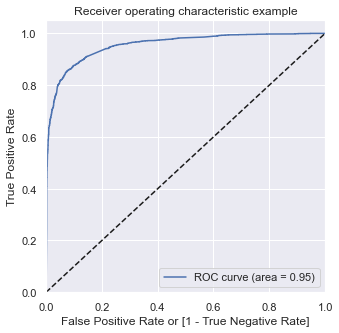

In [139]:
draw_roc(y_train_pred_final.Leads, y_train_pred_final.Leads_Prob)



### -----------------------------------------------------------------------------------
# ※ Finding Optimal Cutoff Point
### -----------------------------------------------------------------------------------


## ✓ Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [140]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Leads_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Leads,Leads_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.997874,1,1,1,1,1,1,1,1,1,1,1
1,0,0.067948,0,1,0,0,0,0,0,0,0,0,0
2,0,0.002568,0,1,0,0,0,0,0,0,0,0,0
3,0,0.562232,1,1,1,1,1,1,1,0,0,0,0
4,0,0.058027,0,1,0,0,0,0,0,0,0,0,0


In [141]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Leads, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.382035  1.000000  0.000000
0.1   0.1  0.781849  0.967220  0.667250
0.2   0.2  0.845238  0.940915  0.786090
0.3   0.3  0.884508  0.887495  0.882662
0.4   0.4  0.896259  0.860380  0.918439
0.5   0.5  0.896722  0.825981  0.940455
0.6   0.6  0.897186  0.799272  0.957718
0.7   0.7  0.883426  0.742614  0.970478
0.8   0.8  0.868120  0.685957  0.980736
0.9   0.9  0.844929  0.608256  0.991243


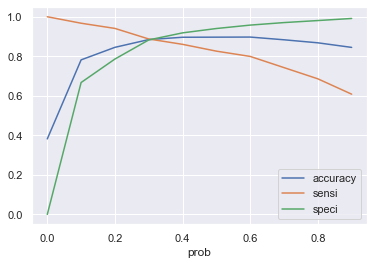

In [142]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [143]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Leads_Prob.map( lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,Leads,Leads_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1,0.997874,1,1,1,1,1,1,1,1,1,1,1,1
1,0,0.067948,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.002568,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.562232,1,1,1,1,1,1,1,0,0,0,0,1
4,0,0.058027,0,1,0,0,0,0,0,0,0,0,0,0


In [144]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Leads, y_train_pred_final.final_predicted)

0.884508348794063

In [145]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Leads, y_train_pred_final.final_predicted )
confusion2

array([[3528,  469],
       [ 278, 2193]], dtype=int64)

In [146]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives


In [147]:
# Let's see the sensitivity of our logistic regression model
print('sensitivity : ',TP / float(TP+FN))

sensitivity :  0.887494941319304


In [148]:
# Let us calculate specificity
print('specificity : ' ,TN / float(TN+FP))

specificity :  0.882661996497373


In [149]:
# Calculate false postive rate - predicting churn when customer does not have churned
print('False postive rate : ' , FP/ float(TN+FP))

False postive rate :  0.11733800350262696


In [150]:
# Positive predictive value 
print ('Positive predictive value  : ',TP / float(TP+FP))

Positive predictive value  :  0.82381667918858


In [151]:
# Negative predictive value
print ('Negative predictive value : ', TN / float(TN+ FN))

Negative predictive value :  0.9269574356279559


In [152]:
## Precision and Recall

In [153]:
confusion = metrics.confusion_matrix(y_train_pred_final.Leads, y_train_pred_final.predicted )
confusion

array([[3759,  238],
       [ 430, 2041]], dtype=int64)

In [154]:
from sklearn.metrics import precision_score, recall_score

In [155]:
print('PRECISION SCORE : ',precision_score(y_train_pred_final.Leads, y_train_pred_final.predicted))

PRECISION SCORE :  0.8955682316805617


In [156]:
print('RECALL SCORE  : ',recall_score(y_train_pred_final.Leads, y_train_pred_final.predicted))

RECALL SCORE  :  0.8259813840550384


In [157]:
from sklearn.metrics import precision_recall_curve

In [158]:
y_train_pred_final.Leads, y_train_pred_final.predicted

(0       1
 1       0
 2       0
 3       0
 4       0
        ..
 6463    1
 6464    0
 6465    0
 6466    0
 6467    0
 Name: Leads, Length: 6468, dtype: int64,
 0       1
 1       0
 2       0
 3       1
 4       0
        ..
 6463    1
 6464    0
 6465    0
 6466    0
 6467    0
 Name: predicted, Length: 6468, dtype: int64)

In [159]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Leads, y_train_pred_final.Leads_Prob)

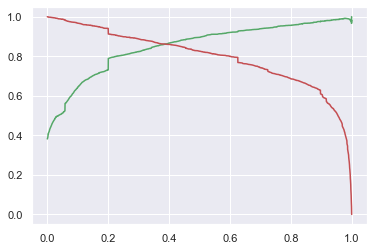

In [160]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [161]:
### Step 11: Making predictions on the test set

In [162]:
# X_test = X_test[col]
X_test.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Lead Add Form,Lead Source_Olark Chat,Lead Source_Reference,Do Not Email_Yes,Last Activity_Olark Chat Conversation,Tags_Interested in other courses,Tags_Ringing,Tags_Will revert after reading the email,Lead Quality_Worst,Lead Profile_Potential Lead,Asymmetrique Activity Index_rare,Last Notable Activity_SMS Sent
Lead Number,,,,,,,,,,,,,,,,
638355,1.0,-0.431495,1.114854,-0.150994,-0.283444,-0.484098,-0.242059,-0.290075,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
630775,1.0,-0.781892,1.384860,-0.711408,3.528029,-0.484098,4.131227,-0.290075,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
616592,1.0,-0.781892,-0.528900,-0.711408,-0.283444,2.065696,-0.242059,-0.290075,2.929543,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252
611224,1.0,0.619695,-0.443155,0.129212,-0.283444,-0.484098,-0.242059,3.447385,-0.341350,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,1.804235
591141,1.0,-1.132288,-0.890125,-1.271821,-0.283444,2.065696,-0.242059,-0.290075,2.929543,-0.239182,-0.388445,-0.538744,-0.263858,-0.460837,-0.204239,-0.554252


In [163]:
y_test_pred = res.predict(X_test)

In [164]:
y_test_pred[:10]

Lead Number
638355    0.356985
630775    0.964819
616592    0.076478
611224    0.174288
591141    0.058027
615032    0.556998
592244    0.200173
634529    0.005397
624575    0.003931
606821    0.398280
dtype: float64

In [165]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [166]:
# Let's see the head
y_pred_1.head()

,0
Lead Number,
638355,0.356985
630775,0.964819
616592,0.076478
611224,0.174288
591141,0.058027


In [167]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [168]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [169]:
y_pred_final.head()

,Converted,0
Lead Number,,
638355,0,0.356985
630775,1,0.964819
616592,0,0.076478
611224,0,0.174288
591141,0,0.058027


In [170]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Leads_Prob'})
# y_train_pred_final = pd.DataFrame({'Leads':y_train.values, 'Leads_Prob':y_train_pred})

In [171]:
# Rearranging the columns
y_pred_final 

,Converted,Leads_Prob
Lead Number,,
638355,0,0.356985
630775,1,0.964819
616592,0,0.076478
611224,0,0.174288
591141,0,0.058027
...,...,...
588753,1,0.723936
580800,0,0.058027
602193,0,0.006115


In [172]:
y_pred_final['final_predicted'] = y_pred_final.Leads_Prob.map(lambda x: 1 if x > 0.4 else 0)

In [173]:
y_pred_final.head()

,Converted,Leads_Prob,final_predicted
Lead Number,,,
638355,0,0.356985,0
630775,1,0.964819,1
616592,0,0.076478,0
611224,0,0.174288,0
591141,0,0.058027,0


In [174]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.898989898989899


### -----------------------------------------------------------------------------------
# ※Over All Accuracy  of Final model  ≈ 89.90%
### -----------------------------------------------------------------------------------


In [175]:
coeffdf =pd.DataFrame(res.params, columns =['coeff'])

coeffdf
coeffdf['coeff'] =coeffdf['coeff'].abs()
coeffdf.sort_values(['coeff'],ascending = False)

,coeff
Tags_Will revert after reading the email,1.512422
Lead Origin_Lead Add Form,1.298576
Tags_Ringing,1.187626
Total Time Spent on Website,1.071958
Last Notable Activity_SMS Sent,0.805659
const,0.734212
Lead Quality_Worst,0.532475
Tags_Interested in other courses,0.512341
Lead Source_Olark Chat,0.458797
Lead Profile_Potential Lead,0.457638


In [176]:
X_train.columns

Index(['const', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'Lead Origin_Lead Add Form',
       'Lead Source_Olark Chat', 'Lead Source_Reference', 'Do Not Email_Yes',
       'Last Activity_Olark Chat Conversation',
       'Tags_Interested in other courses', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Lead Quality_Worst',
       'Lead Profile_Potential Lead', 'Asymmetrique Activity Index_rare',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

In [177]:
cat_cols

[]